# U-Net Windshield Derain with Rain Mask Detection - Google Colab

This notebook trains a U-Net model that outputs:
1. **Derained clean image**
2.  **Binary rain mask** showing where rain drops are located

**Hardware Requirements:**
- Runtime type: GPU (T4, V100, or A100)
- RAM: Standard or High-RAM

## 1. Check GPU and Setup

In [1]:
# Check GPU
!nvidia-smi

import torch
print(f"\nPyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB")

Thu Dec  4 14:46:22 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   29C    P0             43W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

## 2. Mount Google Drive

In [2]:
from google.colab import drive
import os

drive.mount('/content/drive')

# Set paths
DRIVE_ROOT = '/content/drive/MyDrive/windshield_derain'
DATA_DIR = f'{DRIVE_ROOT}/dataset'
CHECKPOINT_DIR = f'{DRIVE_ROOT}/checkpoints'
LOG_DIR = f'{DRIVE_ROOT}/logs'

os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(LOG_DIR, exist_ok=True)

print(f"✓ Google Drive mounted! ")
print(f"Data: {DATA_DIR}")
print(f"Checkpoints: {CHECKPOINT_DIR}")
print(f"Logs: {LOG_DIR}")

Mounted at /content/drive
✓ Google Drive mounted! 
Data: /content/drive/MyDrive/windshield_derain/dataset
Checkpoints: /content/drive/MyDrive/windshield_derain/checkpoints
Logs: /content/drive/MyDrive/windshield_derain/logs


## 3.  Verify Dataset

In [3]:
def count_files(directory):
    try:
        return len([f for f in os.listdir(directory) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    except:
        return 0

print("Dataset Structure:")
print("="*60)
print(f"Train Rainy: {count_files(f'{DATA_DIR}/train/rainy')} images")
print(f"Train Clean: {count_files(f'{DATA_DIR}/train/clean')} images")
print(f"Val Rainy: {count_files(f'{DATA_DIR}/val/rainy')} images")
print(f"Val Clean: {count_files(f'{DATA_DIR}/val/clean')} images")
print("\n✓ Dataset verified!")

Dataset Structure:
Train Rainy: 861 images
Train Clean: 861 images
Val Rainy: 58 images
Val Clean: 58 images

✓ Dataset verified!


## 4. Create Model with Mask Detection

In [4]:
os.makedirs('models', exist_ok=True)

model_code = '''
"""U-Net Derain Model with Rain Mask Detection"""

import torch
import torch.nn as nn
import torch.nn. functional as F


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, padding=1):
        super(ConvBlock, self).__init__()
        self. conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size,
                     padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self. conv(x)


class DownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample_type='maxpool'):
        super(DownBlock, self).__init__()
        self.conv1 = ConvBlock(in_channels, out_channels)
        self. conv2 = ConvBlock(out_channels, out_channels)

        if downsample_type == 'maxpool':
            self.downsample = nn.MaxPool2d(kernel_size=2, stride=2)
        else:
            self.downsample = nn.Conv2d(out_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        skip = x
        x = self.downsample(x)
        return x, skip


class UpBlock(nn. Module):
    def __init__(self, in_channels, skip_channels, out_channels, upsample_type='transpose'):
        super(UpBlock, self).__init__()

        if upsample_type == 'transpose':
            self.upsample = nn. ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        else:
            self.upsample = nn.Sequential(
                nn. Upsample(scale_factor=2, mode='bilinear', align_corners=True),
                nn. Conv2d(in_channels, out_channels, kernel_size=1)
            )

        self.conv1 = ConvBlock(out_channels + skip_channels, out_channels)
        self. conv2 = ConvBlock(out_channels, out_channels)

    def forward(self, x, skip):
        x = self.upsample(x)

        diffY = skip.size()[2] - x. size()[2]
        diffX = skip.size()[3] - x.size()[3]
        x = F.pad(x, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])

        x = torch.cat([skip, x], dim=1)
        x = self.conv1(x)
        x = self. conv2(x)
        return x


class UNetDerainWithMask(nn.Module):
    """U-Net with dual outputs: derained image + rain mask"""
    def __init__(self, in_channels=3, out_channels=3, base_channels=64,
                 img_size=256, downsample_type='maxpool', upsample_type='transpose'):
        super(UNetDerainWithMask, self).__init__()

        self.img_size = img_size

        # Shared Encoder
        self.init_conv = nn.Sequential(
            ConvBlock(in_channels, base_channels),
            ConvBlock(base_channels, base_channels)
        )

        self.down1 = DownBlock(base_channels, base_channels * 2, downsample_type)
        self.down2 = DownBlock(base_channels * 2, base_channels * 4, downsample_type)
        self.down3 = DownBlock(base_channels * 4, base_channels * 8, downsample_type)
        self.down4 = DownBlock(base_channels * 8, base_channels * 16, downsample_type)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            ConvBlock(base_channels * 16, base_channels * 16),
            ConvBlock(base_channels * 16, base_channels * 16)
        )

        # Derain Decoder
        self.up1_derain = UpBlock(base_channels * 16, base_channels * 16, base_channels * 8, upsample_type)
        self.up2_derain = UpBlock(base_channels * 8, base_channels * 8, base_channels * 4, upsample_type)
        self.up3_derain = UpBlock(base_channels * 4, base_channels * 4, base_channels * 2, upsample_type)
        self.up4_derain = UpBlock(base_channels * 2, base_channels * 2, base_channels, upsample_type)

        # Mask Decoder
        self.up1_mask = UpBlock(base_channels * 16, base_channels * 16, base_channels * 8, upsample_type)
        self.up2_mask = UpBlock(base_channels * 8, base_channels * 8, base_channels * 4, upsample_type)
        self.up3_mask = UpBlock(base_channels * 4, base_channels * 4, base_channels * 2, upsample_type)
        self.up4_mask = UpBlock(base_channels * 2, base_channels * 2, base_channels, upsample_type)

        # Outputs
        self.output_derain = nn.Sequential(
            nn.Conv2d(base_channels, out_channels, kernel_size=1),
            nn.Tanh()
        )

        self. output_mask = nn.Sequential(
            nn. Conv2d(base_channels, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        # Encoder
        x0 = self.init_conv(x)
        x1, skip1 = self.down1(x0)
        x2, skip2 = self.down2(x1)
        x3, skip3 = self.down3(x2)
        x4, skip4 = self. down4(x3)

        bottleneck = self.bottleneck(x4)

        # Derain branch
        x_derain = self.up1_derain(bottleneck, skip4)
        x_derain = self.up2_derain(x_derain, skip3)
        x_derain = self.up3_derain(x_derain, skip2)
        x_derain = self.up4_derain(x_derain, skip1)
        derained = self.output_derain(x_derain)

        # Mask branch
        x_mask = self.up1_mask(bottleneck, skip4)
        x_mask = self.up2_mask(x_mask, skip3)
        x_mask = self.up3_mask(x_mask, skip2)
        x_mask = self.up4_mask(x_mask, skip1)
        mask = self.output_mask(x_mask)

        return derained, mask

    def count_parameters(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)
'''

with open('models/unet_derain_with_mask.py', 'w') as f:
    f.write(model_code)

with open('models/__init__.py', 'w') as f:
    f.write('from .unet_derain_with_mask import UNetDerainWithMask\n__all__ = ["UNetDerainWithMask"]')

print("✓ Model files created!")

✓ Model files created!


## 5. Test Model

In [5]:
from models.unet_derain_with_mask import UNetDerainWithMask
import torch

model = UNetDerainWithMask(in_channels=3, out_channels=3, img_size=256)
print(f"Total parameters: {model.count_parameters():,}")

x = torch.randn(2, 3, 256, 256)
derained, mask = model(x)
print(f"Input: {x.shape}")
print(f"Derained: {derained. shape}")
print(f"Mask: {mask.shape}")
print("\n✓ Model test passed!")

del model, x, derained, mask
torch.cuda.empty_cache()

Total parameters: 68,373,572
Input: torch.Size([2, 3, 256, 256])
Derained: torch.Size([2, 3, 256, 256])
Mask: torch.Size([2, 1, 256, 256])

✓ Model test passed!


## 6. Create Training Components

In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import vgg16, VGG16_Weights
from PIL import Image
import numpy as np
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter

from models.unet_derain_with_mask import UNetDerainWithMask


class DerainDatasetWithMask(Dataset):
    """Dataset that auto-generates rain masks from rainy/clean pairs"""
    def __init__(self, rainy_dir, clean_dir, img_size=256, transform=None):
        self.rainy_dir = rainy_dir
        self.clean_dir = clean_dir
        self.img_size = img_size
        self.transform = transform

        self.rainy_images = sorted(os.listdir(rainy_dir))
        self.clean_images = sorted(os.listdir(clean_dir))

        assert len(self.rainy_images) == len(self.clean_images)

    def __len__(self):
        return len(self.rainy_images)

    def __getitem__(self, idx):
        rainy_path = os.path.join(self.rainy_dir, self. rainy_images[idx])
        clean_path = os.path.join(self.clean_dir, self. clean_images[idx])

        rainy_img = Image.open(rainy_path).convert('RGB')
        clean_img = Image.open(clean_path).convert('RGB')

        if self.transform:
            seed = np.random.randint(2147483647)
            torch.manual_seed(seed)
            rainy_img = self.transform(rainy_img)
            torch.manual_seed(seed)
            clean_img = self.transform(clean_img)

        # Auto-generate rain mask from difference
        rain_mask = self. generate_rain_mask(rainy_img, clean_img)

        return rainy_img, clean_img, rain_mask

    def generate_rain_mask(self, rainy, clean):
        """Generate rain mask from difference"""
        diff = torch.abs(rainy - clean)
        mask = torch.mean(diff, dim=0, keepdim=True)
        mask = torch.clamp(mask * 3.0, 0, 1)  # Amplify and clamp
        return mask


class PerceptualLoss(nn.Module):
    """VGG-based perceptual loss"""
    def __init__(self, device='cuda'):
        super(PerceptualLoss, self).__init__()
        vgg = vgg16(weights=VGG16_Weights.IMAGENET1K_V1). features[:16].to(device). eval()
        for param in vgg.parameters():
            param. requires_grad = False
        self.vgg = vgg
        self.criterion = nn.L1Loss()

    def forward(self, pred, target):
        pred_features = self.vgg(pred)
        target_features = self.vgg(target)
        return self.criterion(pred_features, target_features)


class MaskAwareLoss(nn.Module):
    """Combined loss with mask supervision"""
    def __init__(self, alpha=1.0, beta=0.1, gamma=0.5, device='cuda'):
        super(MaskAwareLoss, self).__init__()
        self.alpha = alpha    # L1 loss weight
        self.beta = beta      # Perceptual loss weight
        self.gamma = gamma    # Mask loss weight

        self. l1_loss = nn.L1Loss()
        self.bce_loss = nn.BCELoss()
        self.perceptual_loss = PerceptualLoss(device)

    def forward(self, pred_derain, pred_mask, target_clean, target_mask):
        l1 = self.l1_loss(pred_derain, target_clean)
        perceptual = self.perceptual_loss(pred_derain, target_clean)
        mask_loss = self.bce_loss(pred_mask, target_mask)

        total_loss = self.alpha * l1 + self.beta * perceptual + self.gamma * mask_loss

        return total_loss, l1, perceptual, mask_loss


print("✓ Training components loaded!")

✓ Training components loaded!


## 7. Configure Training

In [8]:
class Config:
    data_dir = DATA_DIR
    checkpoint_dir = CHECKPOINT_DIR
    log_dir = LOG_DIR

    img_size = 256
    batch_size = 16  # Reduce to 8 if OOM
    epochs = 50
    learning_rate = 0.0002
    num_workers = 2

    alpha = 1.0   # L1 loss
    beta = 0.1    # Perceptual loss
    gamma = 0.5   # Mask loss

    save_freq = 10

config = Config()

print("Training Configuration:")
print("="*60)
print(f"Image size: {config.img_size}")
print(f"Batch size: {config.batch_size}")
print(f"Epochs: {config. epochs}")
print(f"Learning rate: {config.learning_rate}")
print(f"Loss weights - L1: {config.alpha}, Perceptual: {config.beta}, Mask: {config.gamma}")
print("="*60)

Training Configuration:
Image size: 256
Batch size: 16
Epochs: 50
Learning rate: 0.0002
Loss weights - L1: 1.0, Perceptual: 0.1, Mask: 0.5


## 8. Setup Data Loaders

In [9]:
transform = transforms.Compose([
    transforms. Resize((config.img_size, config.img_size)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

train_dataset = DerainDatasetWithMask(
    os.path.join(config.data_dir, 'train/rainy'),
    os.path.join(config.data_dir, 'train/clean'),
    img_size=config.img_size,
    transform=transform
)

val_dataset = DerainDatasetWithMask(
    os.path.join(config.data_dir, 'val/rainy'),
    os.path. join(config.data_dir, 'val/clean'),
    img_size=config.img_size,
    transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=config.batch_size,
                         shuffle=True, num_workers=config.num_workers, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=config.batch_size,
                       shuffle=False, num_workers=config.num_workers, pin_memory=True)

print(f"Train samples: {len(train_dataset)}")
print(f"Val samples: {len(val_dataset)}")
print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")
print("\n✓ Data loaders ready!")

Train samples: 861
Val samples: 58
Train batches: 54
Val batches: 4

✓ Data loaders ready!


## 9. Initialize Model

In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}\n")

model = UNetDerainWithMask(
    in_channels=3,
    out_channels=3,
    img_size=config.img_size
).to(device)

print(f"Model parameters: {model.count_parameters():,}")

criterion = MaskAwareLoss(alpha=config.alpha, beta=config. beta,
                         gamma=config.gamma, device=device)
optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)
scheduler = optim.lr_scheduler. ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=5
)

writer = SummaryWriter(config.log_dir)

print("\n✓ Model and training components initialized!")

Using device: cuda

Model parameters: 68,373,572
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:04<00:00, 127MB/s]



✓ Model and training components initialized!


## 10. Define Training Functions

In [12]:
def train_epoch(model, dataloader, criterion, optimizer, device, epoch):
    model.train()
    total_loss = 0
    total_l1 = 0
    total_perceptual = 0
    total_mask = 0

    pbar = tqdm(dataloader, desc=f"Epoch {epoch}")
    for rainy, clean, mask in pbar:
        rainy = rainy.to(device)
        clean = clean.to(device)
        mask = mask.to(device)

        optimizer.zero_grad()
        pred_derain, pred_mask = model(rainy)
        loss, l1, perceptual, mask_loss = criterion(pred_derain, pred_mask, clean, mask)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_l1 += l1.item()
        total_perceptual += perceptual.item()
        total_mask += mask_loss.item()

        pbar. set_postfix({
            'loss': f"{loss.item():.4f}",
            'l1': f"{l1.item():.4f}",
            'mask': f"{mask_loss.item():.4f}"
        })

    n = len(dataloader)
    return total_loss/n, total_l1/n, total_perceptual/n, total_mask/n


def validate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    total_l1 = 0
    total_perceptual = 0
    total_mask = 0

    with torch.no_grad():
        for rainy, clean, mask in tqdm(dataloader, desc="Validation"):
            rainy = rainy.to(device)
            clean = clean.to(device)
            mask = mask.to(device)

            pred_derain, pred_mask = model(rainy)
            loss, l1, perceptual, mask_loss = criterion(pred_derain, pred_mask, clean, mask)

            total_loss += loss.item()
            total_l1 += l1.item()
            total_perceptual += perceptual.item()
            total_mask += mask_loss.item()

    n = len(dataloader)
    return total_loss/n, total_l1/n, total_perceptual/n, total_mask/n

print("✓ Training functions defined!")

✓ Training functions defined!


## 11. Start Training 🚀

In [14]:
best_val_loss = float('inf')

for epoch in range(1, config.epochs + 1):
    print(f"\n{'='*60}")
    print(f"Epoch {epoch}/{config.epochs}")
    print(f"{'='*60}")

    train_loss, train_l1, train_perc, train_mask = train_epoch(
        model, train_loader, criterion, optimizer, device, epoch
    )

    val_loss, val_l1, val_perc, val_mask = validate(
        model, val_loader, criterion, device
    )

    old_lr = optimizer.param_groups[0]['lr']
    scheduler.step(val_loss)
    new_lr = optimizer.param_groups[0]['lr']

    if old_lr != new_lr:
        print(f"\nLR: {old_lr:.6f} -> {new_lr:.6f}")

    writer.add_scalar('Loss/train', train_loss, epoch)
    writer.add_scalar('Loss/val', val_loss, epoch)
    writer.add_scalar('L1/train', train_l1, epoch)
    writer.add_scalar('L1/val', val_l1, epoch)
    writer.add_scalar('Mask/train', train_mask, epoch)
    writer.add_scalar('Mask/val', val_mask, epoch)
    writer.add_scalar('LR', optimizer.param_groups[0]['lr'], epoch)

    print(f"\nTrain - Loss: {train_loss:.4f}, L1: {train_l1:.4f}, Mask: {train_mask:.4f}")
    print(f"Val   - Loss: {val_loss:.4f}, L1: {val_l1:.4f}, Mask: {val_mask:.4f}")

    if epoch % config.save_freq == 0:
        checkpoint_path = os.path.join(config.checkpoint_dir, f'model_epoch_{epoch}.pth')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
        }, checkpoint_path)
        print(f"Checkpoint saved: {checkpoint_path}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_path = os.path.join(config.checkpoint_dir, 'best_model_with_mask.pth')
        torch.save(model.state_dict(), best_model_path)
        print(f"✓ Best model saved (Val Loss: {val_loss:.4f})")

writer.close()
print(f"\n{'='*60}")
print(f"Training completed! Best val loss: {best_val_loss:.4f}")
print(f"{'='*60}")


Epoch 1/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]



Train - Loss: 0.4695, L1: 0.1332, Mask: 0.5537
Val   - Loss: 0.3805, L1: 0.0833, Mask: 0.5026
✓ Best model saved (Val Loss: 0.3805)

Epoch 2/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]



Train - Loss: 0.4525, L1: 0.1266, Mask: 0.5405
Val   - Loss: 0.3508, L1: 0.0722, Mask: 0.4718
✓ Best model saved (Val Loss: 0.3508)

Epoch 3/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.59it/s]



Train - Loss: 0.4465, L1: 0.1263, Mask: 0.5325
Val   - Loss: 0.3451, L1: 0.0692, Mask: 0.4686
✓ Best model saved (Val Loss: 0.3451)

Epoch 4/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]



Train - Loss: 0.4349, L1: 0.1198, Mask: 0.5261
Val   - Loss: 0.3438, L1: 0.0718, Mask: 0.4617
✓ Best model saved (Val Loss: 0.3438)

Epoch 5/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.60it/s]



Train - Loss: 0.4293, L1: 0.1175, Mask: 0.5217
Val   - Loss: 0.3340, L1: 0.0666, Mask: 0.4572
✓ Best model saved (Val Loss: 0.3340)

Epoch 6/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.59it/s]



Train - Loss: 0.4189, L1: 0.1098, Mask: 0.5184
Val   - Loss: 0.3296, L1: 0.0621, Mask: 0.4587
✓ Best model saved (Val Loss: 0.3296)

Epoch 7/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.54it/s]



Train - Loss: 0.4190, L1: 0.1123, Mask: 0.5146
Val   - Loss: 0.3225, L1: 0.0632, Mask: 0.4448
✓ Best model saved (Val Loss: 0.3225)

Epoch 8/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.59it/s]



Train - Loss: 0.4149, L1: 0.1089, Mask: 0.5146
Val   - Loss: 0.3281, L1: 0.0650, Mask: 0.4510

Epoch 9/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]



Train - Loss: 0.4114, L1: 0.1078, Mask: 0.5109
Val   - Loss: 0.3132, L1: 0.0569, Mask: 0.4412
✓ Best model saved (Val Loss: 0.3132)

Epoch 10/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]



Train - Loss: 0.4142, L1: 0.1122, Mask: 0.5085
Val   - Loss: 0.3707, L1: 0.1101, Mask: 0.4456
Checkpoint saved: /content/drive/MyDrive/windshield_derain/checkpoints/model_epoch_10.pth

Epoch 11/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]



Train - Loss: 0.4067, L1: 0.1064, Mask: 0.5059
Val   - Loss: 0.3175, L1: 0.0604, Mask: 0.4435

Epoch 12/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.62it/s]



Train - Loss: 0.4099, L1: 0.1092, Mask: 0.5061
Val   - Loss: 0.3181, L1: 0.0613, Mask: 0.4428

Epoch 13/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.65it/s]



Train - Loss: 0.4001, L1: 0.1023, Mask: 0.5031
Val   - Loss: 0.3237, L1: 0.0639, Mask: 0.4489

Epoch 14/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]



Train - Loss: 0.3962, L1: 0.0988, Mask: 0.5026
Val   - Loss: 0.3181, L1: 0.0593, Mask: 0.4463

Epoch 15/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]



LR: 0.000200 -> 0.000100

Train - Loss: 0.3970, L1: 0.1019, Mask: 0.4992
Val   - Loss: 0.3144, L1: 0.0620, Mask: 0.4357

Epoch 16/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]



Train - Loss: 0.3891, L1: 0.0971, Mask: 0.4954
Val   - Loss: 0.3041, L1: 0.0553, Mask: 0.4317
✓ Best model saved (Val Loss: 0.3041)

Epoch 17/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]



Train - Loss: 0.3888, L1: 0.0972, Mask: 0.4946
Val   - Loss: 0.2978, L1: 0.0501, Mask: 0.4304
✓ Best model saved (Val Loss: 0.2978)

Epoch 18/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.58it/s]



Train - Loss: 0.3856, L1: 0.0956, Mask: 0.4922
Val   - Loss: 0.3082, L1: 0.0552, Mask: 0.4398

Epoch 19/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]



Train - Loss: 0.3845, L1: 0.0948, Mask: 0.4918
Val   - Loss: 0.3006, L1: 0.0517, Mask: 0.4326

Epoch 20/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]



Train - Loss: 0.3819, L1: 0.0931, Mask: 0.4903
Val   - Loss: 0.3102, L1: 0.0597, Mask: 0.4362
Checkpoint saved: /content/drive/MyDrive/windshield_derain/checkpoints/model_epoch_20.pth

Epoch 21/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]



Train - Loss: 0.3838, L1: 0.0940, Mask: 0.4925
Val   - Loss: 0.2977, L1: 0.0497, Mask: 0.4326
✓ Best model saved (Val Loss: 0.2977)

Epoch 22/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.60it/s]



Train - Loss: 0.3826, L1: 0.0938, Mask: 0.4908
Val   - Loss: 0.2973, L1: 0.0505, Mask: 0.4307
✓ Best model saved (Val Loss: 0.2973)

Epoch 23/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.57it/s]



Train - Loss: 0.3794, L1: 0.0918, Mask: 0.4892
Val   - Loss: 0.3051, L1: 0.0574, Mask: 0.4319

Epoch 24/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]



Train - Loss: 0.3827, L1: 0.0957, Mask: 0.4880
Val   - Loss: 0.2997, L1: 0.0527, Mask: 0.4301

Epoch 25/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]



Train - Loss: 0.3827, L1: 0.0957, Mask: 0.4882
Val   - Loss: 0.3096, L1: 0.0618, Mask: 0.4302

Epoch 26/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]



Train - Loss: 0.3761, L1: 0.0898, Mask: 0.4874
Val   - Loss: 0.2981, L1: 0.0521, Mask: 0.4305

Epoch 27/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.57it/s]



Train - Loss: 0.3773, L1: 0.0916, Mask: 0.4866
Val   - Loss: 0.2996, L1: 0.0519, Mask: 0.4336

Epoch 28/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.57it/s]



LR: 0.000100 -> 0.000050

Train - Loss: 0.3792, L1: 0.0941, Mask: 0.4854
Val   - Loss: 0.3176, L1: 0.0637, Mask: 0.4437

Epoch 29/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.62it/s]



Train - Loss: 0.3809, L1: 0.0967, Mask: 0.4843
Val   - Loss: 0.2909, L1: 0.0476, Mask: 0.4263
✓ Best model saved (Val Loss: 0.2909)

Epoch 30/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]



Train - Loss: 0.3698, L1: 0.0872, Mask: 0.4817
Val   - Loss: 0.2918, L1: 0.0479, Mask: 0.4276
Checkpoint saved: /content/drive/MyDrive/windshield_derain/checkpoints/model_epoch_30.pth

Epoch 31/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.62it/s]



Train - Loss: 0.3697, L1: 0.0869, Mask: 0.4824
Val   - Loss: 0.2899, L1: 0.0477, Mask: 0.4246
✓ Best model saved (Val Loss: 0.2899)

Epoch 32/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.58it/s]



Train - Loss: 0.3697, L1: 0.0872, Mask: 0.4820
Val   - Loss: 0.2903, L1: 0.0482, Mask: 0.4239

Epoch 33/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]



Train - Loss: 0.3670, L1: 0.0855, Mask: 0.4802
Val   - Loss: 0.2909, L1: 0.0472, Mask: 0.4269

Epoch 34/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]



Train - Loss: 0.3680, L1: 0.0862, Mask: 0.4810
Val   - Loss: 0.3016, L1: 0.0529, Mask: 0.4356

Epoch 35/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.60it/s]



Train - Loss: 0.3686, L1: 0.0866, Mask: 0.4811
Val   - Loss: 0.2974, L1: 0.0546, Mask: 0.4255

Epoch 36/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.57it/s]



Train - Loss: 0.3682, L1: 0.0868, Mask: 0.4800
Val   - Loss: 0.2939, L1: 0.0479, Mask: 0.4315

Epoch 37/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.54it/s]



LR: 0.000050 -> 0.000025

Train - Loss: 0.3681, L1: 0.0862, Mask: 0.4813
Val   - Loss: 0.2928, L1: 0.0483, Mask: 0.4300

Epoch 38/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]



Train - Loss: 0.3640, L1: 0.0840, Mask: 0.4780
Val   - Loss: 0.2917, L1: 0.0477, Mask: 0.4286

Epoch 39/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.52it/s]



Train - Loss: 0.3633, L1: 0.0838, Mask: 0.4775
Val   - Loss: 0.2904, L1: 0.0474, Mask: 0.4263

Epoch 40/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.66it/s]



Train - Loss: 0.3588, L1: 0.0806, Mask: 0.4752
Val   - Loss: 0.2896, L1: 0.0476, Mask: 0.4250
Checkpoint saved: /content/drive/MyDrive/windshield_derain/checkpoints/model_epoch_40.pth
✓ Best model saved (Val Loss: 0.2896)

Epoch 41/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]



Train - Loss: 0.3606, L1: 0.0818, Mask: 0.4763
Val   - Loss: 0.2875, L1: 0.0455, Mask: 0.4249
✓ Best model saved (Val Loss: 0.2875)

Epoch 42/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]



Train - Loss: 0.3589, L1: 0.0804, Mask: 0.4759
Val   - Loss: 0.2917, L1: 0.0477, Mask: 0.4285

Epoch 43/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.54it/s]



Train - Loss: 0.3608, L1: 0.0827, Mask: 0.4750
Val   - Loss: 0.2861, L1: 0.0460, Mask: 0.4222
✓ Best model saved (Val Loss: 0.2861)

Epoch 44/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]



Train - Loss: 0.3584, L1: 0.0808, Mask: 0.4742
Val   - Loss: 0.2935, L1: 0.0477, Mask: 0.4316

Epoch 45/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.62it/s]



Train - Loss: 0.3587, L1: 0.0810, Mask: 0.4747
Val   - Loss: 0.2845, L1: 0.0455, Mask: 0.4198
✓ Best model saved (Val Loss: 0.2845)

Epoch 46/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.67it/s]



Train - Loss: 0.3568, L1: 0.0792, Mask: 0.4742
Val   - Loss: 0.2891, L1: 0.0467, Mask: 0.4255

Epoch 47/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.60it/s]



Train - Loss: 0.3566, L1: 0.0792, Mask: 0.4739
Val   - Loss: 0.2826, L1: 0.0447, Mask: 0.4189
✓ Best model saved (Val Loss: 0.2826)

Epoch 48/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.58it/s]



Train - Loss: 0.3564, L1: 0.0786, Mask: 0.4746
Val   - Loss: 0.2832, L1: 0.0447, Mask: 0.4196

Epoch 49/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]



Train - Loss: 0.3571, L1: 0.0802, Mask: 0.4734
Val   - Loss: 0.2890, L1: 0.0462, Mask: 0.4268

Epoch 50/50


Validation: 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]



Train - Loss: 0.3556, L1: 0.0786, Mask: 0.4736
Val   - Loss: 0.2878, L1: 0.0458, Mask: 0.4254
Checkpoint saved: /content/drive/MyDrive/windshield_derain/checkpoints/model_epoch_50.pth

Training completed! Best val loss: 0.2826


## 12.  Load TensorBoard

In [15]:
%load_ext tensorboard
%tensorboard --logdir {config.log_dir}

<IPython.core.display.Javascript object>

## 13.  Visualize Results with Rain Mask

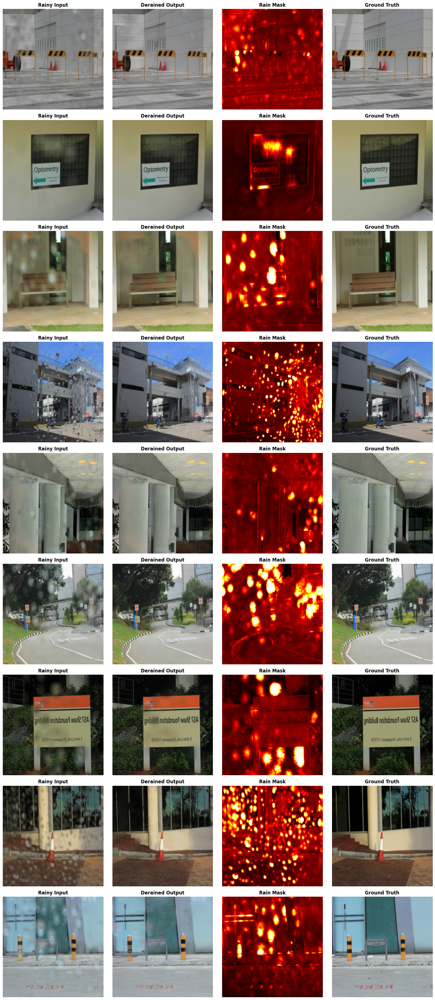

✓ Results visualized!


In [20]:
import matplotlib.pyplot as plt

def denormalize(tensor):
    return (tensor * 0.5 + 0.5).clamp(0, 1)

# Load best model
model.load_state_dict(torch.load(os.path.join(config.checkpoint_dir, 'best_model_with_mask.pth')))
model. eval()

# Get a batch
rainy, clean, target_mask = next(iter(val_loader))
rainy = rainy.to(device)
clean = clean. to(device)

with torch.no_grad():
    derained, pred_mask = model(rainy)

# Visualize
num_samples = min(9, rainy.size(0))
fig, axes = plt.subplots(num_samples, 4, figsize=(16, num_samples * 4))

if num_samples == 1:
    axes = axes.reshape(1, -1)

for i in range(num_samples):
    # Rainy input
    axes[i, 0].imshow(denormalize(rainy[i]). cpu().permute(1, 2, 0). numpy())
    axes[i, 0]. set_title('Rainy Input', fontweight='bold')
    axes[i, 0].axis('off')

    # Derained output
    axes[i, 1].imshow(denormalize(derained[i]).cpu().permute(1, 2, 0).numpy())
    axes[i, 1].set_title('Derained Output', fontweight='bold')
    axes[i, 1].axis('off')

    # Rain mask
    axes[i, 2].imshow(pred_mask[i].squeeze().cpu().numpy(), cmap='hot')
    axes[i, 2].set_title('Rain Mask', fontweight='bold')
    axes[i, 2].axis('off')

    # Ground truth
    axes[i, 3].imshow(denormalize(clean[i]).cpu().permute(1, 2, 0).numpy())
    axes[i, 3].set_title('Ground Truth', fontweight='bold')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(config.checkpoint_dir, 'results_with_mask.png'), dpi=150, bbox_inches='tight')
plt.show()

print("✓ Results visualized!")

## 14.  Single Image Inference

In [17]:
def inference_single_image(image_path, model, device, img_size=256):
    """Run inference on single image and return derained + mask"""
    transform = transforms.Compose([
        transforms. Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])

    image = Image.open(image_path).convert('RGB')
    original_size = image.size
    image_tensor = transform(image).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        derained, mask = model(image_tensor)

    # Convert to images
    derained_img = denormalize(derained. squeeze(0)). cpu()
    derained_pil = transforms.ToPILImage()(derained_img)
    derained_pil = derained_pil.resize(original_size, Image.LANCZOS)

    mask_img = mask.squeeze(). cpu(). numpy()
    mask_pil = Image.fromarray((mask_img * 255).astype(np.uint8))
    mask_pil = mask_pil.resize(original_size, Image.LANCZOS)

    return derained_pil, mask_pil

print("✓ Inference function ready!")
print("\nUsage:")
print("derained, mask = inference_single_image('path/to/image.jpg', model, device)")
print("derained. save('clean. png')")
print("mask.save('rain_mask.png')")

✓ Inference function ready!

Usage:
derained, mask = inference_single_image('path/to/image.jpg', model, device)
derained. save('clean. png')
mask.save('rain_mask.png')


## 15. Download Model

In [19]:
from google.colab import files

best_model_path = os.path.join(config.checkpoint_dir, 'best_model_with_mask.pth')
if os.path.exists(best_model_path):
    files.download(best_model_path)
    print(f"✓ Downloaded: {best_model_path}")
else:
    print("❌ Model not found! ")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✓ Downloaded: /content/drive/MyDrive/windshield_derain/checkpoints/best_model_with_mask.pth
